In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import scipy.stats as ss
import matplotlib.pyplot as plt
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split

import shap
import lime
import lime.lime_tabular

c:\Users\nicholaschen\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def showFeatureDetail(dataset, featureName):
  featureList = list(dataset.columns)
  print('No. Feature: ', featureList.index(featureName) + 1)
  print('Feature Name: ', featureName)

  print('Total Unique Value: ', dataset[featureName].value_counts(dropna=False).index.size, end=' ')
  if (dataset[featureName].value_counts(dropna=False).index.size == 1): print('(single-value)')
  elif (dataset[featureName].value_counts(dropna=False).index.size == len(dataset.index)): print('(all-unique-value)')
  else: print('')
  
  print('Value Type: ', dataset.dtypes[featureName])
  print('Description: ')
  print('')
  print('Total each value:')
  print(dataset[featureName].value_counts(dropna=False))

In [3]:
def cramers_v(x, y):
  confusion_matrix = pd.crosstab(x,y)
  chi2 = ss.chi2_contingency(confusion_matrix)[0]
  n = confusion_matrix.sum().sum()
  phi2 = chi2/n
  r,k = confusion_matrix.shape
  phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
  rcorr = r-((r-1)**2)/(n-1)
  kcorr = k-((k-1)**2)/(n-1)
  return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))

<span style="font-weight:700;font-size:36px">
  Data Understanding
</span>

<span style="font-weight:300;font-size:24px">
  1. example data in dataset
</span>

In [4]:
APADDoSDataset = pd.read_csv("./data/APA-DDoS-Dataset.csv")

APADDoSDataset.head()

,ip.src,ip.dst,tcp.srcport,tcp.dstport,ip.proto,frame.len,tcp.flags.syn,tcp.flags.reset,tcp.flags.push,tcp.flags.ack,...,tcp.seq,tcp.ack,frame.time,Packets,Bytes,Tx Packets,Tx Bytes,Rx Packets,Rx Bytes,Label
0,192.168.1.1,192.168.23.2,2412,8000,6,54,0,0,1,1,...,1,1,16-Jun 2020 20:18:15.071112000 Mountain Dayli...,8,432,4,216,4,216,DDoS-PSH-ACK
1,192.168.1.1,192.168.23.2,2413,8000,6,54,0,0,1,1,...,1,1,16-Jun 2020 20:18:15.071138000 Mountain Dayli...,10,540,5,270,5,270,DDoS-PSH-ACK
2,192.168.1.1,192.168.23.2,2414,8000,6,54,0,0,1,1,...,1,1,16-Jun 2020 20:18:15.071146000 Mountain Dayli...,12,648,6,324,6,324,DDoS-PSH-ACK
3,192.168.1.1,192.168.23.2,2415,8000,6,54,0,0,1,1,...,1,1,16-Jun 2020 20:18:15.071152000 Mountain Dayli...,10,540,5,270,5,270,DDoS-PSH-ACK
4,192.168.1.1,192.168.23.2,2416,8000,6,54,0,0,1,1,...,1,1,16-Jun 2020 20:18:15.071159000 Mountain Dayli...,6,324,3,162,3,162,DDoS-PSH-ACK


<span style="font-weight:300;font-size:24px">
  2. Feature's data type
</span>

In [5]:
print('Total Feature: ', APADDoSDataset.columns.size)
print('')
print('Feature List: ')
APADDoSDataset.dtypes

Total Feature:  23

Feature List: 


ip.src             object
ip.dst             object
tcp.srcport         int64
tcp.dstport         int64
ip.proto            int64
frame.len           int64
tcp.flags.syn       int64
tcp.flags.reset     int64
tcp.flags.push      int64
tcp.flags.ack       int64
ip.flags.mf         int64
ip.flags.df         int64
ip.flags.rb         int64
tcp.seq             int64
tcp.ack             int64
frame.time         object
Packets             int64
Bytes               int64
Tx Packets          int64
Tx Bytes            int64
Rx Packets          int64
Rx Bytes            int64
Label              object
dtype: object

<span style="font-weight:300;font-size:24px">
  3. total unique value in each feature
</span>

In [6]:
for featureName in APADDoSDataset.columns:
  print(f'{featureName}\t\t: {APADDoSDataset[featureName].value_counts(dropna=False).index.size}', end=' ')
  if (APADDoSDataset[featureName].value_counts(dropna=False).index.size == 1): print('(single-value)')
  elif (APADDoSDataset[featureName].value_counts(dropna=False).index.size == len(APADDoSDataset.index)): print('(all-unique-value)')
  else: print('')

ip.src		: 14 
ip.dst		: 1 (single-value)
tcp.srcport		: 31009 
tcp.dstport		: 1 (single-value)
ip.proto		: 1 (single-value)
frame.len		: 4 
tcp.flags.syn		: 1 (single-value)
tcp.flags.reset		: 1 (single-value)
tcp.flags.push		: 2 
tcp.flags.ack		: 1 (single-value)
ip.flags.mf		: 1 (single-value)
ip.flags.df		: 2 
ip.flags.rb		: 1 (single-value)
tcp.seq		: 1 (single-value)
tcp.ack		: 1 (single-value)
frame.time		: 151200 (all-unique-value)
Packets		: 19 
Bytes		: 29 
Tx Packets		: 10 
Tx Bytes		: 12 
Rx Packets		: 11 
Rx Bytes		: 21 
Label		: 3 


<span style="font-weight:300;font-size:24px">
  4. Value distribution in each feature
</span>

In [7]:
featureTitleList = list(APADDoSDataset.columns)

# Data type will contain 2 value: categorical, or numeric
featureDataType = {}

No. Feature:  1
Feature Name:  ip.src
Total Unique Value:  14 
Value Type:  object
Description: 

Total each value:
192.168.1.1     10800
192.168.4.1     10800
192.168.7.1     10800
192.168.17.1    10800
192.168.14.1    10800
192.168.11.1    10800
192.168.20.1    10800
192.168.2.1     10800
192.168.5.1     10800
192.168.8.1     10800
192.168.16.1    10800
192.168.13.1    10800
192.168.10.1    10800
192.168.19.1    10800
Name: ip.src, dtype: int64


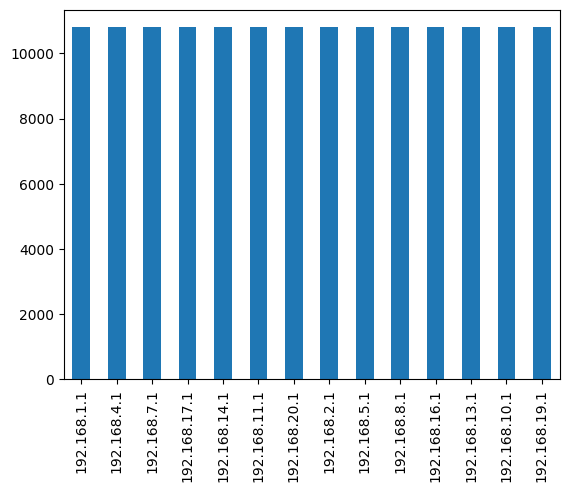

In [8]:
featureTitle = featureTitleList[0]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().plot(kind='bar')

featureDataType[featureTitle] = 'categorical'

No. Feature:  2
Feature Name:  ip.dst
Total Unique Value:  1 (single-value)
Value Type:  object
Description: 

Total each value:
192.168.23.2    151200
Name: ip.dst, dtype: int64


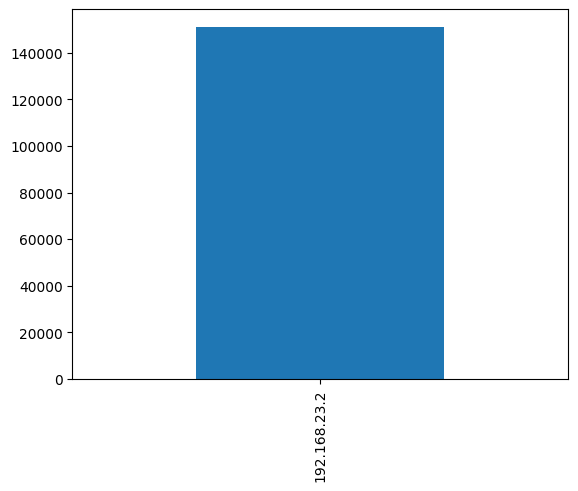

In [9]:
featureTitle = featureTitleList[1]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().plot(kind='bar')

featureDataType[featureTitle] = 'categorical'

No. Feature:  3
Feature Name:  tcp.srcport
Total Unique Value:  31009 
Value Type:  int64
Description: 

Total each value:
4986     12
10824    12
9574     12
2868     12
9684     12
         ..
17667     1
17670     1
17671     1
17673     1
16522     1
Name: tcp.srcport, Length: 31009, dtype: int64


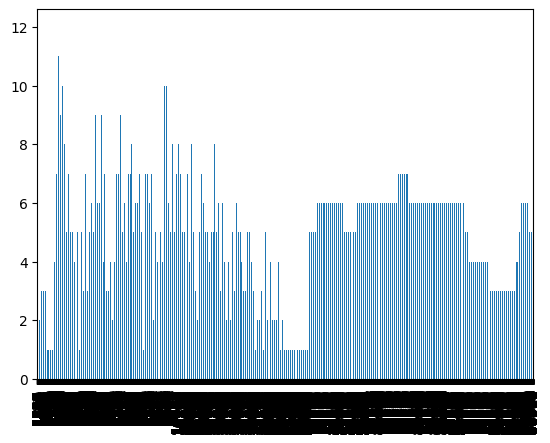

In [10]:
featureTitle = featureTitleList[2]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().sort_index().plot(kind='bar')

featureDataType[featureTitle] = 'categorical'

No. Feature:  4
Feature Name:  tcp.dstport
Total Unique Value:  1 (single-value)
Value Type:  int64
Description: 

Total each value:
8000    151200
Name: tcp.dstport, dtype: int64


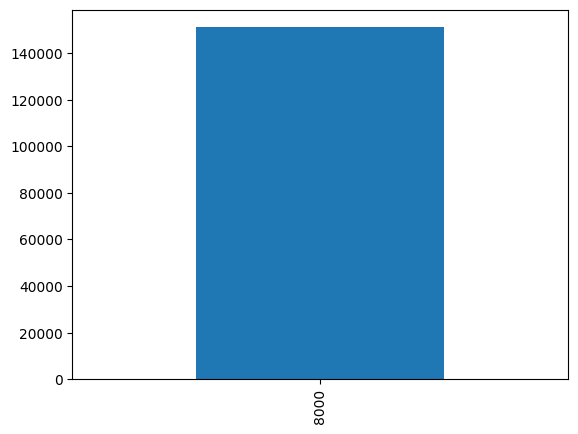

In [11]:
featureTitle = featureTitleList[3]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().sort_index().plot(kind='bar')

featureDataType[featureTitle] = 'categorical'

No. Feature:  5
Feature Name:  ip.proto
Total Unique Value:  1 (single-value)
Value Type:  int64
Description: 

Total each value:
6    151200
Name: ip.proto, dtype: int64


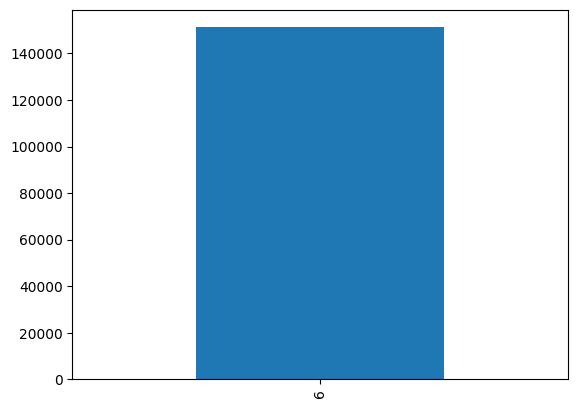

In [12]:
featureTitle = featureTitleList[4]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().sort_index().plot(kind='bar')

featureDataType[featureTitle] = 'categorical'

No. Feature:  6
Feature Name:  frame.len
Total Unique Value:  4 
Value Type:  int64
Description: 

Total each value:
54     75600
66     37800
222    34001
223     3799
Name: frame.len, dtype: int64


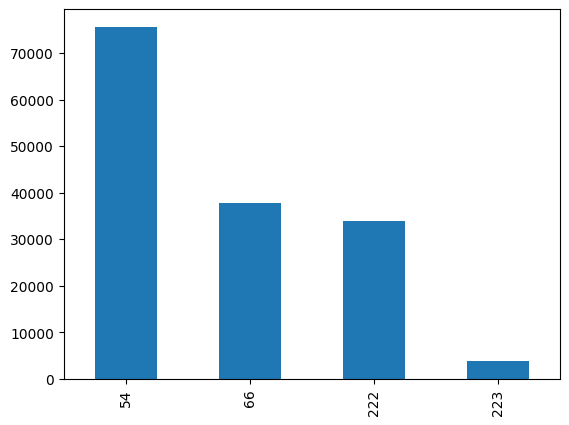

In [13]:
featureTitle = featureTitleList[5]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().sort_index().plot(kind='bar')

featureDataType[featureTitle] = 'categorical'

No. Feature:  7
Feature Name:  tcp.flags.syn
Total Unique Value:  1 (single-value)
Value Type:  int64
Description: 

Total each value:
0    151200
Name: tcp.flags.syn, dtype: int64


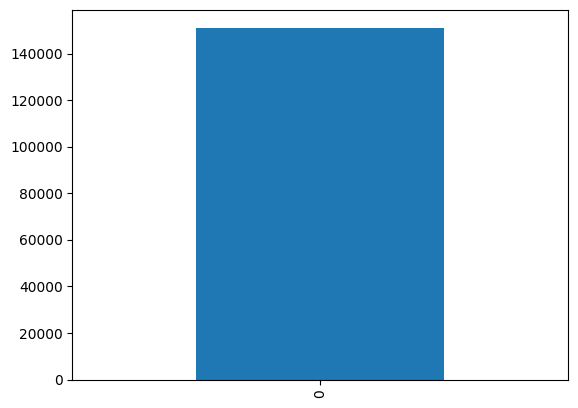

In [14]:
featureTitle = featureTitleList[6]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().sort_index().plot(kind='bar')

featureDataType[featureTitle] = 'categorical'

No. Feature:  8
Feature Name:  tcp.flags.reset
Total Unique Value:  1 (single-value)
Value Type:  int64
Description: 

Total each value:
0    151200
Name: tcp.flags.reset, dtype: int64


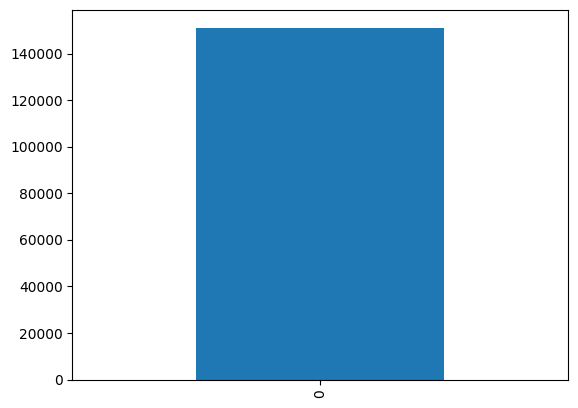

In [15]:
featureTitle = featureTitleList[7]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().sort_index().plot(kind='bar')

featureDataType[featureTitle] = 'categorical'

No. Feature:  9
Feature Name:  tcp.flags.push
Total Unique Value:  2 
Value Type:  int64
Description: 

Total each value:
1    75600
0    75600
Name: tcp.flags.push, dtype: int64


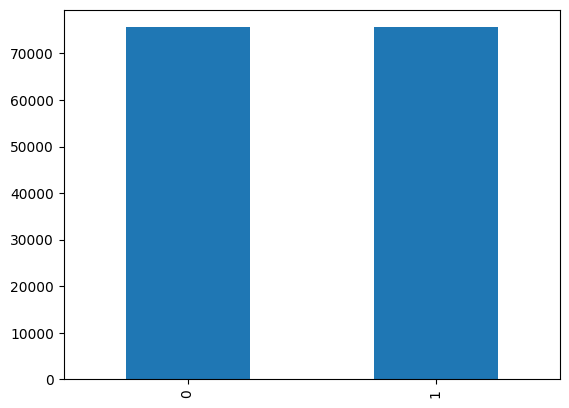

In [16]:
featureTitle = featureTitleList[8]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().sort_index().plot(kind='bar')

featureDataType[featureTitle] = 'categorical'

No. Feature:  10
Feature Name:  tcp.flags.ack
Total Unique Value:  1 (single-value)
Value Type:  int64
Description: 

Total each value:
1    151200
Name: tcp.flags.ack, dtype: int64


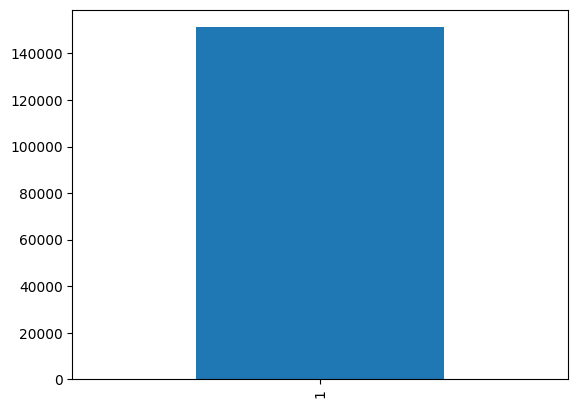

In [17]:
featureTitle = featureTitleList[9]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().sort_index().plot(kind='bar')

featureDataType[featureTitle] = 'categorical'

No. Feature:  11
Feature Name:  ip.flags.mf
Total Unique Value:  1 (single-value)
Value Type:  int64
Description: 

Total each value:
0    151200
Name: ip.flags.mf, dtype: int64


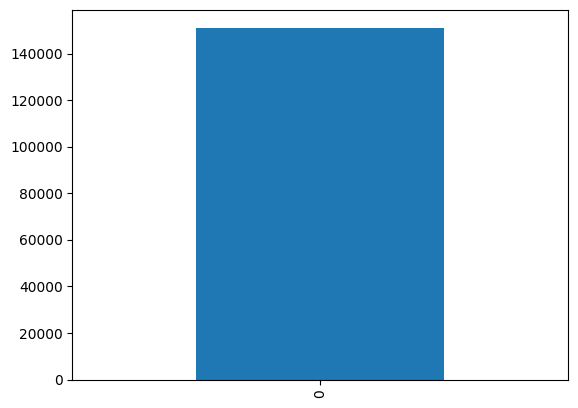

In [18]:
featureTitle = featureTitleList[10]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().sort_index().plot(kind='bar')

featureDataType[featureTitle] = 'categorical'

No. Feature:  12
Feature Name:  ip.flags.df
Total Unique Value:  2 
Value Type:  int64
Description: 

Total each value:
0    75600
1    75600
Name: ip.flags.df, dtype: int64


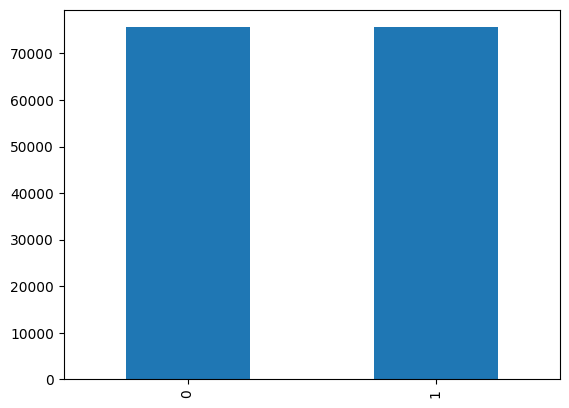

In [19]:
featureTitle = featureTitleList[11]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().sort_index().plot(kind='bar')

featureDataType[featureTitle] = 'categorical'

No. Feature:  13
Feature Name:  ip.flags.rb
Total Unique Value:  1 (single-value)
Value Type:  int64
Description: 

Total each value:
0    151200
Name: ip.flags.rb, dtype: int64


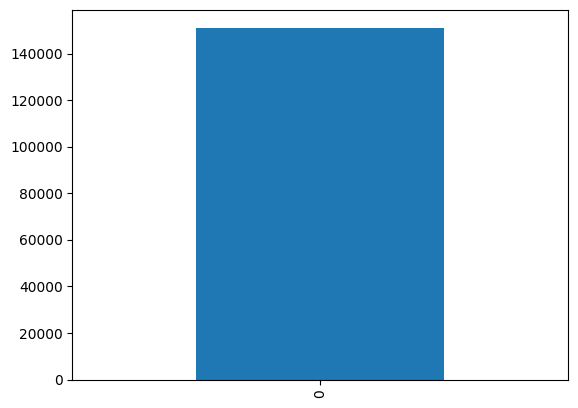

In [20]:
featureTitle = featureTitleList[12]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().sort_index().plot(kind='bar')

featureDataType[featureTitle] = 'categorical'

No. Feature:  14
Feature Name:  tcp.seq
Total Unique Value:  1 (single-value)
Value Type:  int64
Description: 

Total each value:
1    151200
Name: tcp.seq, dtype: int64


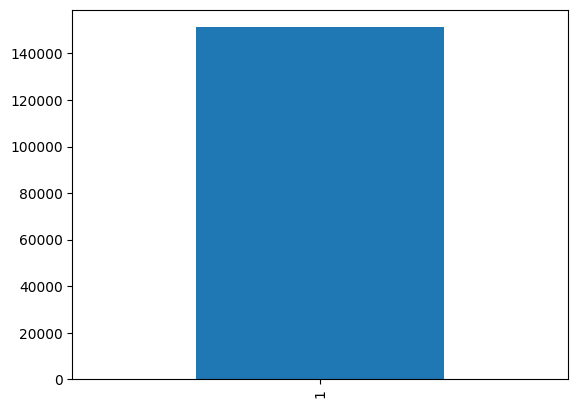

In [21]:
featureTitle = featureTitleList[13]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().sort_index().plot(kind='bar')

featureDataType[featureTitle] = 'categorical'

No. Feature:  15
Feature Name:  tcp.ack
Total Unique Value:  1 (single-value)
Value Type:  int64
Description: 

Total each value:
1    151200
Name: tcp.ack, dtype: int64


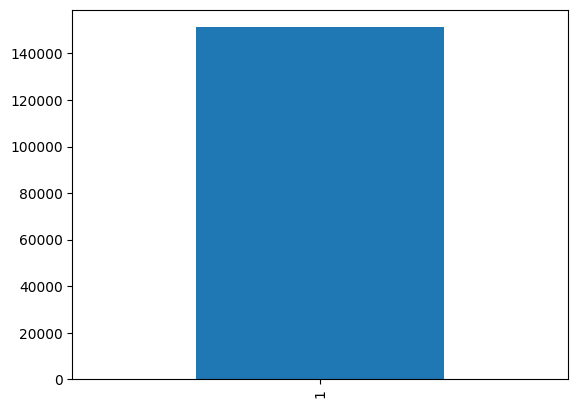

In [22]:
featureTitle = featureTitleList[14]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().sort_index().plot(kind='bar')

featureDataType[featureTitle] = 'categorical'

In [23]:
featureTitle = featureTitleList[15]

# clean frame.time from prefix ' ' and suffix ' Mountain Daylight Time'.
try:
  presufCleanedSeries = APADDoSDataset['frame.time'].str.removesuffix(' Mountain Daylight Time').str.removeprefix(' ')
except:
  print('frame.time is no longer a string')

# convert frame.time from str to timestamp
APADDoSDataset['frame.time'] = pd.to_datetime(
  presufCleanedSeries,
  format='%d-%b %Y %H:%M:%S.%f',
  exact=False,
)
# convert frame.time from timestamp to numeric
APADDoSDataset['frame.time'] = pd.to_numeric(APADDoSDataset['frame.time'])
APADDoSDataset

showFeatureDetail(APADDoSDataset, featureTitle)

featureDataType[featureTitle] = 'numeric'

No. Feature:  16
Feature Name:  frame.time
Total Unique Value:  151186 
Value Type:  int64
Description: 

Total each value:
1592344869160000000    8
1592339127107160000    2
1592339042916000000    2
1592339214516000000    2
1592344677982160000    2
                      ..
1592338904783470000    1
1592338904794403000    1
1592338904805850000    1
1592338904817607000    1
1592345446984798000    1
Name: frame.time, Length: 151186, dtype: int64


No. Feature:  17
Feature Name:  Packets
Total Unique Value:  19 
Value Type:  int64
Description: 

Total each value:
10    92229
8     20818
6     16446
12     8017
4      7280
14     2229
2      1504
9       643
7       635
16      476
11      336
5       304
13      123
3        70
18       38
15       34
17        8
1         8
20        2
Name: Packets, dtype: int64


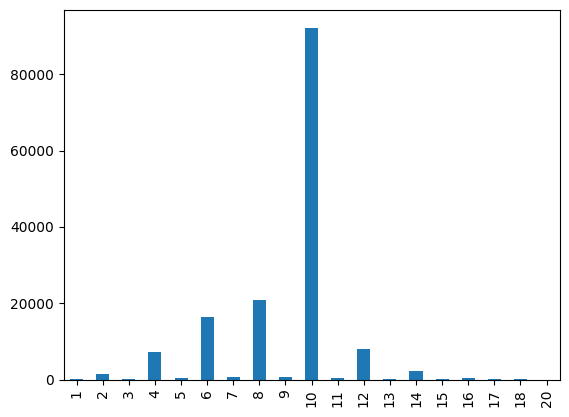

In [24]:
featureTitle = featureTitleList[16]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().sort_index().plot(kind='bar')

featureDataType[featureTitle] = 'numeric'

No. Feature:  18
Feature Name:  Bytes
Total Unique Value:  29 
Value Type:  int64
Description: 

Total each value:
432     20818
540     16629
324     16446
648      8017
1151     7664
1134     7625
1123     7620
1140     7595
1146     7595
1229     7568
1175     7536
1144     7472
1168     7466
1170     7459
216      7280
756      2229
108      1504
486       643
378       635
864       476
594       336
270       304
702       123
162        70
972        38
810        34
918         8
54          8
1080        2
Name: Bytes, dtype: int64


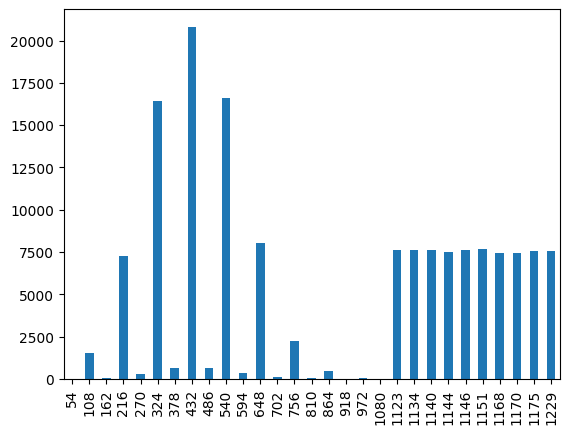

In [25]:
featureTitle = featureTitleList[17]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().sort_index().plot(kind='bar')

featureDataType[featureTitle] = 'numeric'

No. Feature:  19
Feature Name:  Tx Packets
Total Unique Value:  10 
Value Type:  int64
Description: 

Total each value:
6     83961
4     21452
5     17275
3     16741
2      7346
7      2355
1      1512
8       510
9        46
10        2
Name: Tx Packets, dtype: int64


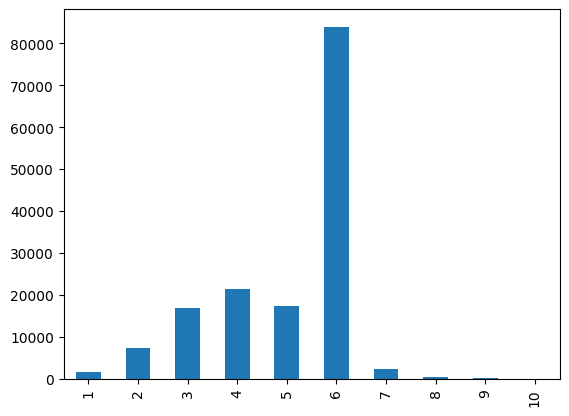

In [26]:
featureTitle = featureTitleList[18]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().sort_index().plot(kind='bar')

featureDataType[featureTitle] = 'numeric'

No. Feature:  20
Feature Name:  Tx Bytes
Total Unique Value:  12 
Value Type:  int64
Description: 

Total each value:
560    68032
216    21452
270    17275
162    16741
324     8361
561     7568
108     7346
378     2355
54      1512
432      510
486       46
540        2
Name: Tx Bytes, dtype: int64


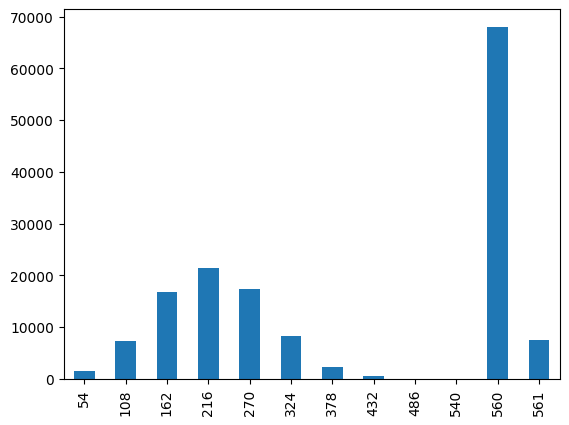

In [27]:
featureTitle = featureTitleList[19]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().sort_index().plot(kind='bar')

featureDataType[featureTitle] = 'numeric'

No. Feature:  21
Feature Name:  Rx Packets
Total Unique Value:  11 
Value Type:  int64
Description: 

Total each value:
4     97058
3     17082
5     16957
6      8137
2      7593
7      2263
1      1578
8       484
9        38
0         8
10        2
Name: Rx Packets, dtype: int64


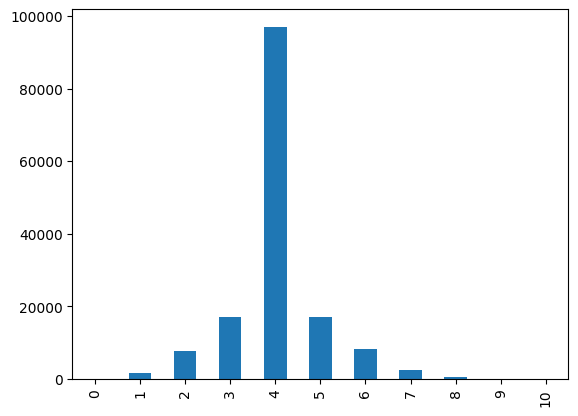

In [28]:
featureTitle = featureTitleList[20]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().sort_index().plot(kind='bar')

featureDataType[featureTitle] = 'numeric'

No. Feature:  22
Feature Name:  Rx Bytes
Total Unique Value:  21 
Value Type:  int64
Description: 

Total each value:
216    21458
162    17082
270    16957
324     8137
591     7664
574     7625
563     7620
586     7595
580     7595
108     7593
668     7568
615     7536
584     7472
608     7466
610     7459
378     2263
54      1578
432      484
486       38
0          8
540        2
Name: Rx Bytes, dtype: int64


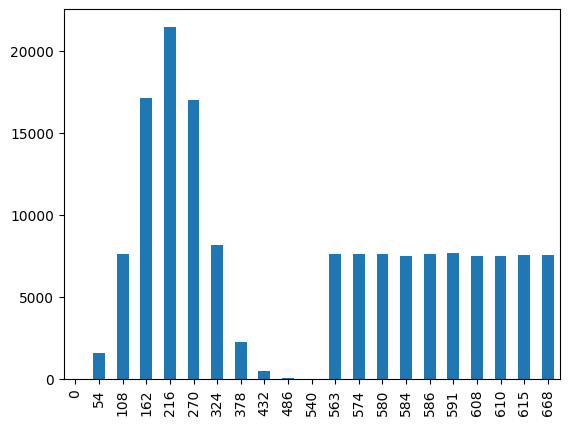

In [29]:
featureTitle = featureTitleList[21]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().sort_index().plot(kind='bar')

featureDataType[featureTitle] = 'numeric'

No. Feature:  23
Feature Name:  Label
Total Unique Value:  3 
Value Type:  object
Description: 

Total each value:
Benign          75600
DDoS-PSH-ACK    37800
DDoS-ACK        37800
Name: Label, dtype: int64


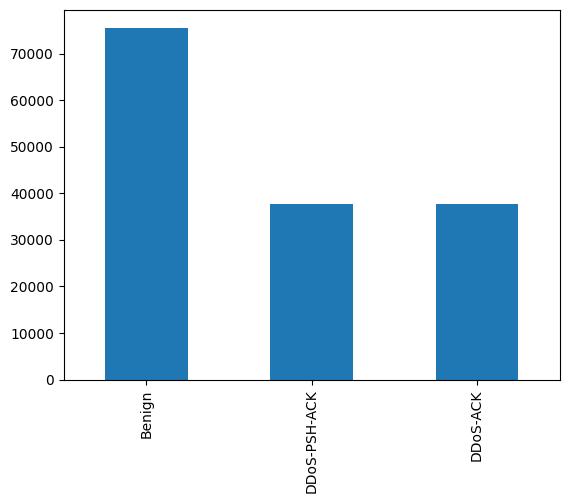

In [30]:
featureTitle = featureTitleList[22]

showFeatureDetail(APADDoSDataset, featureTitle)
APADDoSDataset[featureTitle].value_counts().plot(kind='bar')

featureDataType[featureTitle] = 'categorical'

<span style="font-weight:300;font-size:24px">
  5. Correlation between features and label
</span>

invalid value encountered in double_scalars
invalid value encountered in double_scalars
invalid value encountered in double_scalars
invalid value encountered in double_scalars
invalid value encountered in double_scalars
invalid value encountered in double_scalars
invalid value encountered in double_scalars
invalid value encountered in double_scalars
invalid value encountered in double_scalars
invalid value encountered in double_scalars


AxesSubplot(0.1,0.15;0.8x0.75)
AxesSubplot(0.1,0.15;0.8x0.75)
AxesSubplot(0.1,0.15;0.8x0.75)
AxesSubplot(0.1,0.15;0.8x0.75)
AxesSubplot(0.1,0.15;0.8x0.75)
AxesSubplot(0.1,0.15;0.8x0.75)
AxesSubplot(0.1,0.15;0.8x0.75)


ip.src             0.707051
ip.dst                  NaN
tcp.srcport        0.610546
tcp.dstport             NaN
ip.proto                NaN
frame.len          0.707097
tcp.flags.syn           NaN
tcp.flags.reset         NaN
tcp.flags.push     0.707100
tcp.flags.ack           NaN
ip.flags.mf             NaN
ip.flags.df        0.999997
ip.flags.rb             NaN
tcp.seq                 NaN
tcp.ack                 NaN
Label              1.000000
dtype: float64

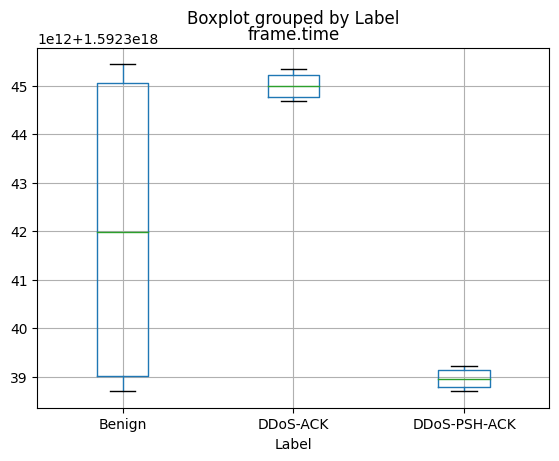

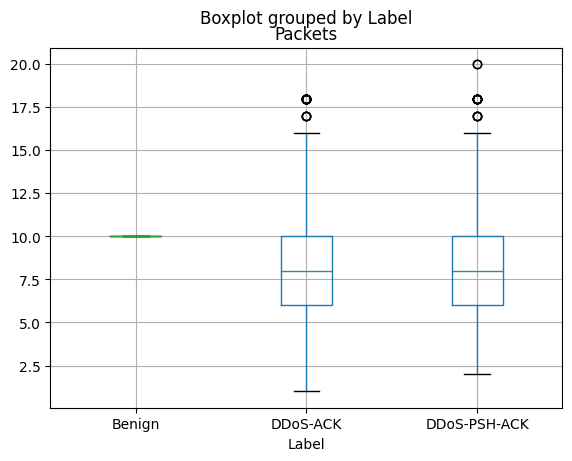

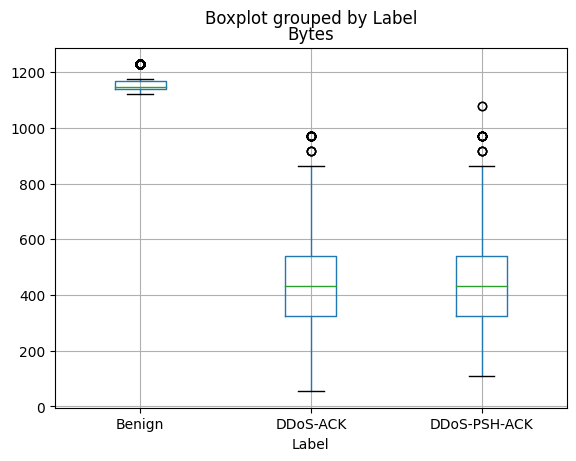

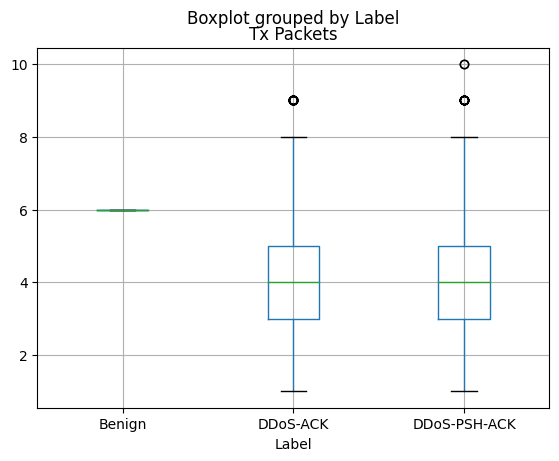

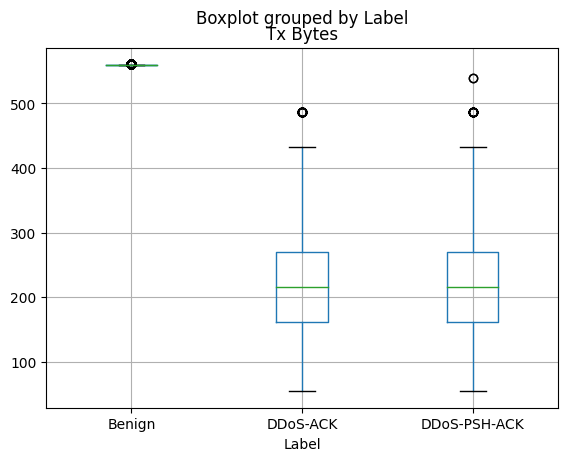

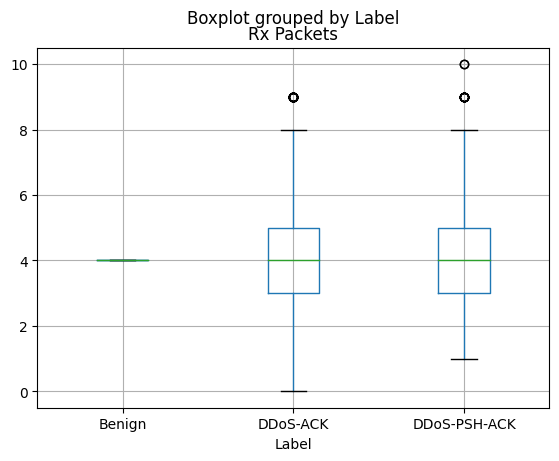

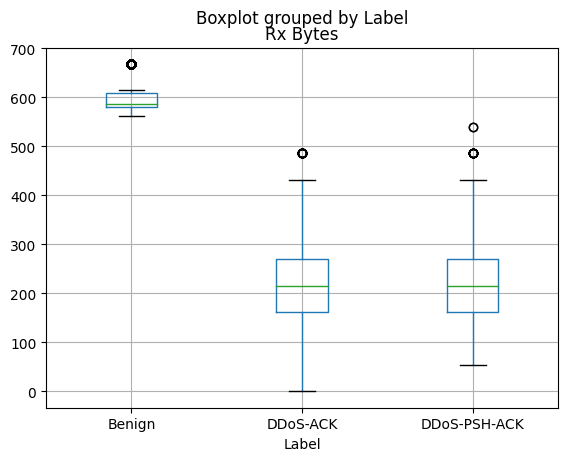

In [31]:
featureList = list(APADDoSDataset.columns)
labelCorrDict = {}

for featureName in featureList:
  if featureDataType[featureName] == 'categorical':
    labelCorrDict[featureName] = cramers_v(APADDoSDataset[featureName], APADDoSDataset['Label'])
  else:
    print(APADDoSDataset.boxplot(featureName, by='Label'))

s = pd.Series(labelCorrDict)
s

<span style="font-weight:500;font-size:24px">
  Note to be taken:
</span><br/>
<ul style="font-weight:300;font-size:20px">
  <li>
    from all categorical features, some of them have NaN value in corr with 'Label':
    </br>
    <ul style="font-weight:300;font-size:16px">
      <li>ip.src&emsp;0.707051</li> 
      <li>ip.dst&emsp;NaN</li> 
      <li>tcp.srcport&emsp;0.610546</li> 
      <li>tcp.dstport&emsp;NaN</li> 
      <li>ip.proto&emsp;NaN</li> 
      <li>frame.len&emsp;0.707097</li> 
      <li>tcp.flags.syn&emsp;NaN</li> 
      <li>tcp.flags.reset&emsp;NaN</li> 
      <li>tcp.flags.push&emsp;0.707100</li> 
      <li>tcp.flags.ack&emsp;NaN</li> 
      <li>ip.flags.mf&emsp;NaN</li> 
      <li>ip.flags.df&emsp;0.999997</li> 
      <li>ip.flags.rb&emsp;NaN</li> 
      <li>tcp.seq&emsp;NaN</li> 
      <li>tcp.ack&emsp;NaN</li> 
    </ul><br/>
  </li>
  <li>
    from all numeric features, all of them have correlation with 'Label'
</ul><br/>

<span style="font-weight:700;font-size:36px">
  Preprocessing
</span><br/>

<span style="font-weight:500;font-size:24px">
  Feature selection
</span><br/>
<span style="font-weight:300;font-size:20px">
  remove all categorical features that have NaN corr value 
</span>

In [32]:
nanFeatures = list()

# get all nan feat.
for key in labelCorrDict:
  if np.isnan(labelCorrDict[key]):
    nanFeatures.append(key)

# remove all nan feat.
try:
  for feat in nanFeatures:
    featureList.remove(feat)
except:
  print('nan feat has been removed from featureList')

dfRemovedFeature = APADDoSDataset.copy()

dfRemovedFeature = APADDoSDataset.drop(nanFeatures, axis=1)
dfRemovedFeature

,ip.src,tcp.srcport,frame.len,tcp.flags.push,ip.flags.df,frame.time,Packets,Bytes,Tx Packets,Tx Bytes,Rx Packets,Rx Bytes,Label
0,192.168.1.1,2412,54,1,0,1592338695071112000,8,432,4,216,4,216,DDoS-PSH-ACK
1,192.168.1.1,2413,54,1,0,1592338695071138000,10,540,5,270,5,270,DDoS-PSH-ACK
2,192.168.1.1,2414,54,1,0,1592338695071146000,12,648,6,324,6,324,DDoS-PSH-ACK
3,192.168.1.1,2415,54,1,0,1592338695071152000,10,540,5,270,5,270,DDoS-PSH-ACK
4,192.168.1.1,2416,54,1,0,1592338695071159000,6,324,3,162,3,162,DDoS-PSH-ACK
...,...,...,...,...,...,...,...,...,...,...,...,...,...
151195,192.168.19.1,37360,66,0,1,1592345446923006000,10,1146,6,560,4,586,Benign
151196,192.168.19.1,37362,66,0,1,1592345446935672000,10,1151,6,560,4,591,Benign
151197,192.168.19.1,37364,66,0,1,1592345446957469000,10,1144,6,560,4,584,Benign
151198,192.168.19.1,37366,66,0,1,1592345446970971000,10,1175,6,560,4,615,Benign


<span style="font-weight:500;font-size:24px">
  Check NaN value in dataframe
</span><br/>

In [33]:
print(dfRemovedFeature.isnull().values.any())

False


<span style="font-weight:500;font-size:24px">
  Label Reduction
</span><br/>
<span style="font-weight:300;font-size:20px">
  make label value into binary: 'benign' or 'malignant'
</span>

In [34]:
dfLabelReducted = dfRemovedFeature.copy()

for value in dfLabelReducted['Label'].value_counts(dropna=False).index:
  if value != 'Benign':
    dfLabelReducted['Label'] = dfLabelReducted['Label'].replace([value], 'Malignant')

dfLabelReducted

,ip.src,tcp.srcport,frame.len,tcp.flags.push,ip.flags.df,frame.time,Packets,Bytes,Tx Packets,Tx Bytes,Rx Packets,Rx Bytes,Label
0,192.168.1.1,2412,54,1,0,1592338695071112000,8,432,4,216,4,216,Malignant
1,192.168.1.1,2413,54,1,0,1592338695071138000,10,540,5,270,5,270,Malignant
2,192.168.1.1,2414,54,1,0,1592338695071146000,12,648,6,324,6,324,Malignant
3,192.168.1.1,2415,54,1,0,1592338695071152000,10,540,5,270,5,270,Malignant
4,192.168.1.1,2416,54,1,0,1592338695071159000,6,324,3,162,3,162,Malignant
...,...,...,...,...,...,...,...,...,...,...,...,...,...
151195,192.168.19.1,37360,66,0,1,1592345446923006000,10,1146,6,560,4,586,Benign
151196,192.168.19.1,37362,66,0,1,1592345446935672000,10,1151,6,560,4,591,Benign
151197,192.168.19.1,37364,66,0,1,1592345446957469000,10,1144,6,560,4,584,Benign
151198,192.168.19.1,37366,66,0,1,1592345446970971000,10,1175,6,560,4,615,Benign


<span style="font-weight:500;font-size:24px">
  Check Duplicate in row
</span><br/>

In [35]:
dups = dfLabelReducted.duplicated()
# report if there are any duplicates
print('Is there duplicate row? ', dups.any())
# list all duplicate rows
print(dfLabelReducted[dups])

Is there duplicate row?  False
Empty DataFrame
Columns: [ip.src, tcp.srcport, frame.len, tcp.flags.push, ip.flags.df, frame.time, Packets, Bytes, Tx Packets, Tx Bytes, Rx Packets, Rx Bytes, Label]
Index: []


<span style="font-weight:500;font-size:24px">
  One-hot Encoding
</span><br/>
<span style="font-weight:300;font-size:20px">
  encode 'ip.src' using one-hot encoding
</span>

In [36]:
dfOnehotEncoded = dfLabelReducted.copy()

# create encoder and encode 'ip.src'
enc = OneHotEncoder()
dfOneHotResult = pd.get_dummies(dfOnehotEncoded['ip.src'], prefix='ip.src')

# drop initial 'ip.src' column
dfOnehotEncoded = dfOnehotEncoded.drop(['ip.src'], axis=1)

# merge one-hot result to initial df
for featureName in dfOneHotResult.columns:
  dfOnehotEncoded[featureName] = dfOneHotResult[featureName].tolist()

dfOnehotEncoded

,tcp.srcport,frame.len,tcp.flags.push,ip.flags.df,frame.time,Packets,Bytes,Tx Packets,Tx Bytes,Rx Packets,...,ip.src_192.168.14.1,ip.src_192.168.16.1,ip.src_192.168.17.1,ip.src_192.168.19.1,ip.src_192.168.2.1,ip.src_192.168.20.1,ip.src_192.168.4.1,ip.src_192.168.5.1,ip.src_192.168.7.1,ip.src_192.168.8.1
0,2412,54,1,0,1592338695071112000,8,432,4,216,4,...,0,0,0,0,0,0,0,0,0,0
1,2413,54,1,0,1592338695071138000,10,540,5,270,5,...,0,0,0,0,0,0,0,0,0,0
2,2414,54,1,0,1592338695071146000,12,648,6,324,6,...,0,0,0,0,0,0,0,0,0,0
3,2415,54,1,0,1592338695071152000,10,540,5,270,5,...,0,0,0,0,0,0,0,0,0,0
4,2416,54,1,0,1592338695071159000,6,324,3,162,3,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151195,37360,66,0,1,1592345446923006000,10,1146,6,560,4,...,0,0,0,1,0,0,0,0,0,0
151196,37362,66,0,1,1592345446935672000,10,1151,6,560,4,...,0,0,0,1,0,0,0,0,0,0
151197,37364,66,0,1,1592345446957469000,10,1144,6,560,4,...,0,0,0,1,0,0,0,0,0,0
151198,37366,66,0,1,1592345446970971000,10,1175,6,560,4,...,0,0,0,1,0,0,0,0,0,0


<span style="font-weight:500;font-size:24px">
  Label Encoding
</span><br/>
<span style="font-weight:300;font-size:20px">
  encode 'tcp.srcport' and 'Label' using label encoding
</span>

In [37]:
dfLabelEncoded = dfOnehotEncoded.copy()
label_encoder = LabelEncoder()

dfLabelEncoded['tcp.srcport'] = label_encoder.fit_transform(dfLabelEncoded['tcp.srcport'])
dfLabelEncoded['Label'] = label_encoder.fit_transform(dfLabelEncoded['Label'])

print(dfOnehotEncoded['Label'].unique())
print(dfLabelEncoded['Label'].unique())

# move 'Label' column to the last column
column_to_move = dfLabelEncoded.pop("Label")
dfLabelEncoded.insert(dfLabelEncoded.columns.size, "Label", column_to_move)

dfLabelEncoded

['Malignant' 'Benign']
[1 0]


,tcp.srcport,frame.len,tcp.flags.push,ip.flags.df,frame.time,Packets,Bytes,Tx Packets,Tx Bytes,Rx Packets,...,ip.src_192.168.16.1,ip.src_192.168.17.1,ip.src_192.168.19.1,ip.src_192.168.2.1,ip.src_192.168.20.1,ip.src_192.168.4.1,ip.src_192.168.5.1,ip.src_192.168.7.1,ip.src_192.168.8.1,Label
0,1086,54,1,0,1592338695071112000,8,432,4,216,4,...,0,0,0,0,0,0,0,0,0,1
1,1087,54,1,0,1592338695071138000,10,540,5,270,5,...,0,0,0,0,0,0,0,0,0,1
2,1088,54,1,0,1592338695071146000,12,648,6,324,6,...,0,0,0,0,0,0,0,0,0,1
3,1089,54,1,0,1592338695071152000,10,540,5,270,5,...,0,0,0,0,0,0,0,0,0,1
4,1090,54,1,0,1592338695071159000,6,324,3,162,3,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151195,19189,66,0,1,1592345446923006000,10,1146,6,560,4,...,0,0,1,0,0,0,0,0,0,0
151196,19190,66,0,1,1592345446935672000,10,1151,6,560,4,...,0,0,1,0,0,0,0,0,0,0
151197,19191,66,0,1,1592345446957469000,10,1144,6,560,4,...,0,0,1,0,0,0,0,0,0,0
151198,19192,66,0,1,1592345446970971000,10,1175,6,560,4,...,0,0,1,0,0,0,0,0,0,0


<span style="font-weight:500;font-size:24px">
  Data Standardisation
</span><br/>
<span style="font-weight:300;font-size:20px">
  standardize all feature range to 0-1
</span>

In [38]:
dfStandarded = dfLabelEncoded.copy()

dfStandardedWithoutLabel = dfStandarded.loc[:, dfLabelEncoded.columns != 'Label']
dfStandardedLabel = dfStandarded.loc[:, dfLabelEncoded.columns == 'Label']

# standardizing process start here
arrayStandardedWithoutLabel = dfStandardedWithoutLabel.to_numpy()

scaler = MinMaxScaler()
arrayStandardedWithoutLabel = scaler.fit_transform(arrayStandardedWithoutLabel)

dfStandardedWithoutLabel = pd.DataFrame(arrayStandardedWithoutLabel, columns = dfStandardedWithoutLabel.columns)
dfStandardedWithoutLabel

,tcp.srcport,frame.len,tcp.flags.push,ip.flags.df,frame.time,Packets,Bytes,Tx Packets,Tx Bytes,Rx Packets,...,ip.src_192.168.14.1,ip.src_192.168.16.1,ip.src_192.168.17.1,ip.src_192.168.19.1,ip.src_192.168.2.1,ip.src_192.168.20.1,ip.src_192.168.4.1,ip.src_192.168.5.1,ip.src_192.168.7.1,ip.src_192.168.8.1
0,0.035023,0.000000,1.0,0.0,0.000000e+00,0.368421,0.321702,0.333333,0.319527,0.4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.035055,0.000000,1.0,0.0,3.841706e-09,0.473684,0.413617,0.444444,0.426036,0.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.035088,0.000000,1.0,0.0,5.034963e-09,0.578947,0.505532,0.555556,0.532544,0.6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.035120,0.000000,1.0,0.0,5.937181e-09,0.473684,0.413617,0.444444,0.426036,0.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.035152,0.000000,1.0,0.0,6.955815e-09,0.263158,0.229787,0.222222,0.213018,0.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151195,0.618840,0.071006,0.0,1.0,9.999908e-01,0.473684,0.929362,0.555556,0.998028,0.4,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
151196,0.618873,0.071006,0.0,1.0,9.999927e-01,0.473684,0.933617,0.555556,0.998028,0.4,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
151197,0.618905,0.071006,0.0,1.0,9.999960e-01,0.473684,0.927660,0.555556,0.998028,0.4,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
151198,0.618937,0.071006,0.0,1.0,9.999980e-01,0.473684,0.954043,0.555556,0.998028,0.4,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [39]:
# TEMP: checking all feature type
for feat in featureList:
  print(feat)
  print(featureDataType[feat])
  print()

ip.src
categorical

tcp.srcport
categorical

frame.len
categorical

tcp.flags.push
categorical

ip.flags.df
categorical

frame.time
numeric

Packets
numeric

Bytes
numeric

Tx Packets
numeric

Tx Bytes
numeric

Rx Packets
numeric

Rx Bytes
numeric

Label
categorical



<span style="font-weight:500;font-size:24px">
  Correlation Check
</span><br/>
<span style="font-weight:300;font-size:20px">
  Feature selection via high correlation features
</span>

Text(0.5, 1.0, 'Correlation Heatmap')

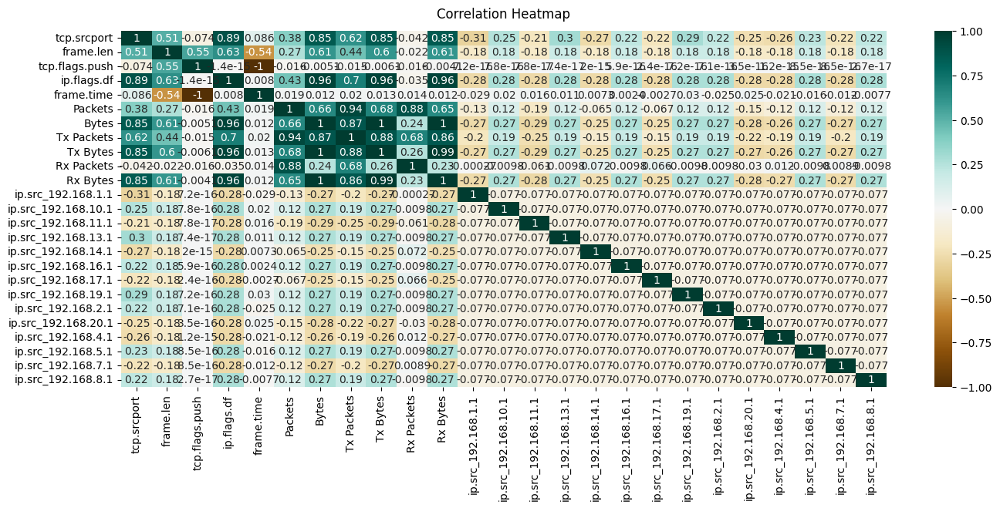

In [40]:
corr_matrix = dfStandardedWithoutLabel.corr()

# Increase the size of the heatmap.
plt.figure(figsize=(16, 6))
# Store heatmap object in a variable to easily access it when you want to include more features (such as title).
# Set the range of values to be displayed on the colormap from -1 to 1, and set the annotation to True to display the correlation values on the heatmap.
heatmap = sns.heatmap(corr_matrix, vmin=-1, vmax=1, annot=True, cmap='BrBG')
# Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

<span style="font-weight:500;font-size:24px">
  Remove all feature with high correlation
</span><br/>

In [41]:
# getting all high correlated features
correlated_features = set()

for i in range(len(corr_matrix.columns)):
  for j in range(i):
    if abs(corr_matrix.iloc[i, j]) > 0.8:
      colname = corr_matrix.columns[i]
      correlated_features.add(colname)

print(len(correlated_features))
print(correlated_features)

7
{'ip.flags.df', 'Tx Packets', 'Bytes', 'Rx Packets', 'Tx Bytes', 'Rx Bytes', 'frame.time'}


In [42]:
# Deleting
dfStandardedWithoutLabel.drop(labels=correlated_features, axis=1, inplace=True)

Text(0.5, 1.0, 'Correlation Heatmap')

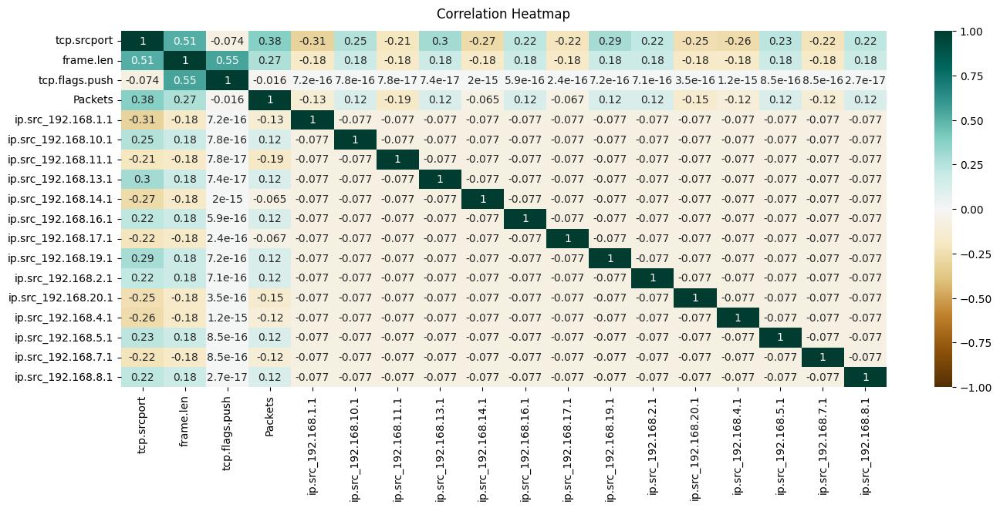

In [43]:
# After Delete Check
corr_matrix = dfStandardedWithoutLabel.corr()

# Increase the size of the heatmap.
plt.figure(figsize=(16, 6))
# Store heatmap object in a variable to easily access it when you want to include more features (such as title).
# Set the range of values to be displayed on the colormap from -1 to 1, and set the annotation to True to display the correlation values on the heatmap.
heatmap = sns.heatmap(corr_matrix, vmin=-1, vmax=1, annot=True, cmap='BrBG')
# Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

In [44]:
# Rejoin label with the rest of dataframe
dfPreprocessed = dfStandardedWithoutLabel.copy()
dfPreprocessed.insert(dfPreprocessed.columns.size, "Label", dfStandardedLabel)

# Seperate df by Label value
# Malignant === 1 in label column
dfMalignant = dfPreprocessed[dfPreprocessed["Label"] == 1]
dfBenign = dfPreprocessed[dfPreprocessed["Label"] == 0]

# sample each df by 200 randomly
dfSampledMalignant = dfMalignant.sample(n=200, random_state=42)
dfSampledBenign = dfBenign.sample(n=200, random_state=42)

# join all df to make dfSampled
frame = [dfSampledMalignant, dfSampledBenign]
dfSampled = pd.concat(frame, copy=True)

# Seperate dfSample to X and y
dfSampledWithoutLabel = dfSampled.loc[:, dfSampled.columns != 'Label']
dfSampledLabel = dfSampled.loc[:, dfSampled.columns == 'Label']


<span style="font-weight:500;font-size:24px">
  KNN
</span><br/>

In [45]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

k = 7
k_range = np.arange(1, 12)
X = dfSampledWithoutLabel.to_numpy()
y = np.squeeze(dfSampledLabel.to_numpy())

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42)

print('y_test', y_test)

# sklearn KNN
knn = KNeighborsClassifier(n_neighbors=k)
knn.fit(X_train, y_train)
print("sklearn KNN")
y_pred = knn.predict(X_test)
print(y_pred)
print("Score: " + str(knn.score(X_test, y_test)))

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

y_test [0 0 1 0 1 1 0 1 0 1 1 0 1 1 1 1 0 0 0 0 1 1 0 0 1 0 1 0 0 1 0 1 0 1 0 1 1
 0 1 1 0 1 1 1 1 0 1 1 1 1 1 0 0 1 0 1 0 1 1 1 1 0 0 1 1 1 0 0 0 1 0 1 1 1
 0 0 0 0 1 0]
sklearn KNN
[0 0 1 0 1 1 0 1 0 1 1 0 1 1 1 1 0 0 0 0 1 1 0 0 1 0 1 0 0 1 0 1 0 1 0 1 1
 0 1 1 0 1 1 1 1 0 1 1 1 1 1 0 0 1 0 1 0 1 1 1 1 0 0 1 1 1 0 0 0 1 0 1 1 1
 0 0 0 0 1 0]
Score: 1.0
Accuracy: 1.0


100%|██████████| 80/80 [00:12<00:00,  6.44it/s]
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


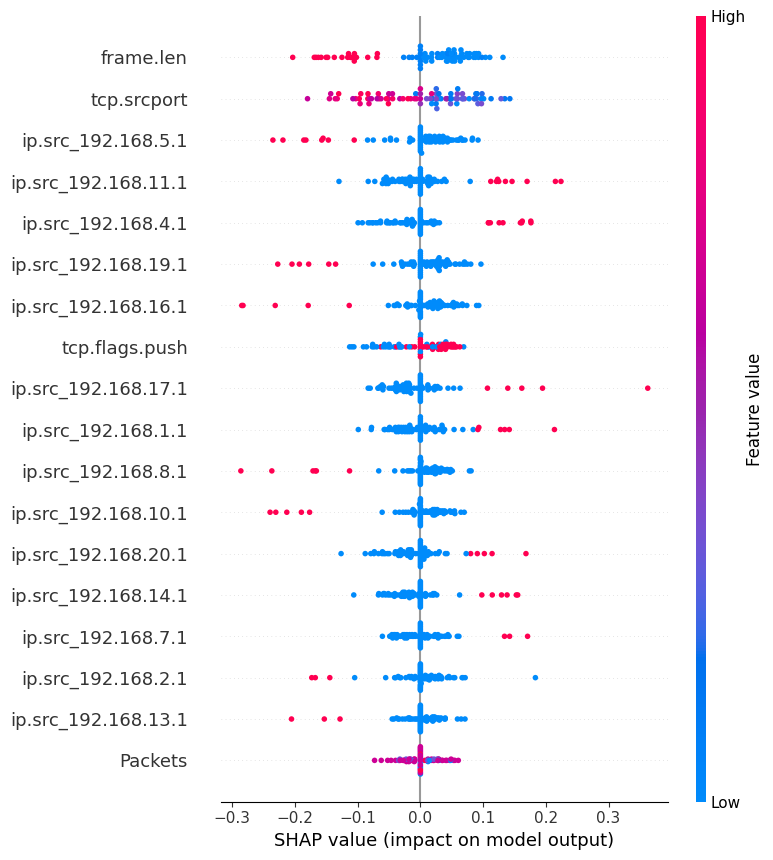

In [46]:
# Get shap values
shap.initjs()
explainer = shap.KernelExplainer(knn.predict, np.array(X_test))
svc_shap_values = explainer.shap_values(np.array(X_test), nsamples=100)
# shap.force_plot(svc_shap_values, numpy.array(X_test))
# shap.force_plot(explainer.expected_value, svc_shap_values)
shap.summary_plot(svc_shap_values, np.array(X_test), feature_names=list(dfSampledWithoutLabel.columns))

In [47]:
# LIME has one explainer for all the models
limeExplainer = lime.lime_tabular.LimeTabularExplainer(
  np.array(X_train), 
  # feature_names=X_train.columns.values.tolist(),
  # class_names=['MEDV'],
  verbose=True, 
  mode='classification',
  feature_names=list(dfSampledWithoutLabel.columns)
)

In [48]:
dfSampledWithoutLabel.head()

,tcp.srcport,frame.len,tcp.flags.push,Packets,ip.src_192.168.1.1,ip.src_192.168.10.1,ip.src_192.168.11.1,ip.src_192.168.13.1,ip.src_192.168.14.1,ip.src_192.168.16.1,ip.src_192.168.17.1,ip.src_192.168.19.1,ip.src_192.168.2.1,ip.src_192.168.20.1,ip.src_192.168.4.1,ip.src_192.168.5.1,ip.src_192.168.7.1,ip.src_192.168.8.1
99179,0.162281,0.0,0.0,0.473684,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
26976,0.405089,0.0,1.0,0.368421,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
111455,0.300568,0.0,0.0,0.368421,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
82306,0.137158,0.0,0.0,0.315789,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
89853,0.369485,0.0,0.0,0.263158,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [49]:
exp = limeExplainer.explain_instance(np.array(X_test)[5], knn.predict_proba, num_features=18)
exp.show_in_notebook(show_table=True)

Intercept 0.12541518150713316
Prediction_local [1.04755866]
Right: 1.0


<span style="font-weight:500;font-size:24px">
  my KNN
</span><br/>


my KNN
[0 0 1 0 1 1 0 1 0 1 1 0 1 1 1 1 0 0 0 0 1 1 0 0 1 0 1 0 0 1 0 1 0 1 0 1 1
 0 1 1 0 1 1 1 1 0 1 1 1 1 1 0 0 1 0 1 0 1 1 1 1 0 0 1 1 1 0 0 0 1 0 1 1 1
 0 0 0 0 1 0]
1.0


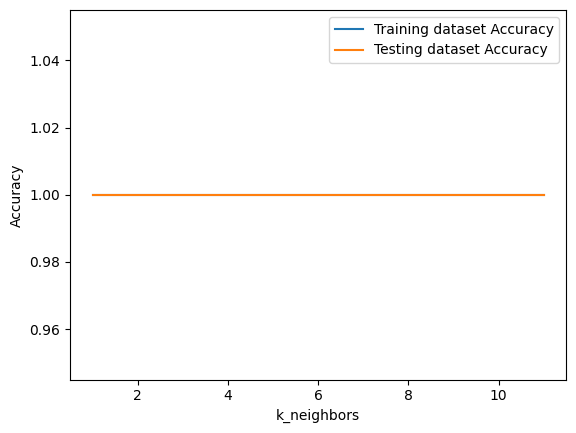

[[1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]]


In [50]:
from KNN import KNN

# my KNN
myknn = KNN(k_neighbors=k)
myknn.fit(X_train, y_train)
print()
print("my KNN")
print(myknn.predict(X_test))
print(myknn.score(X_test, y_test))
myknn.showScoreInGraph(k_range, X_test, y_test)
print(myknn.predict_proba(np.array(X_test)))

100%|██████████| 80/80 [14:03<00:00, 10.54s/it]
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


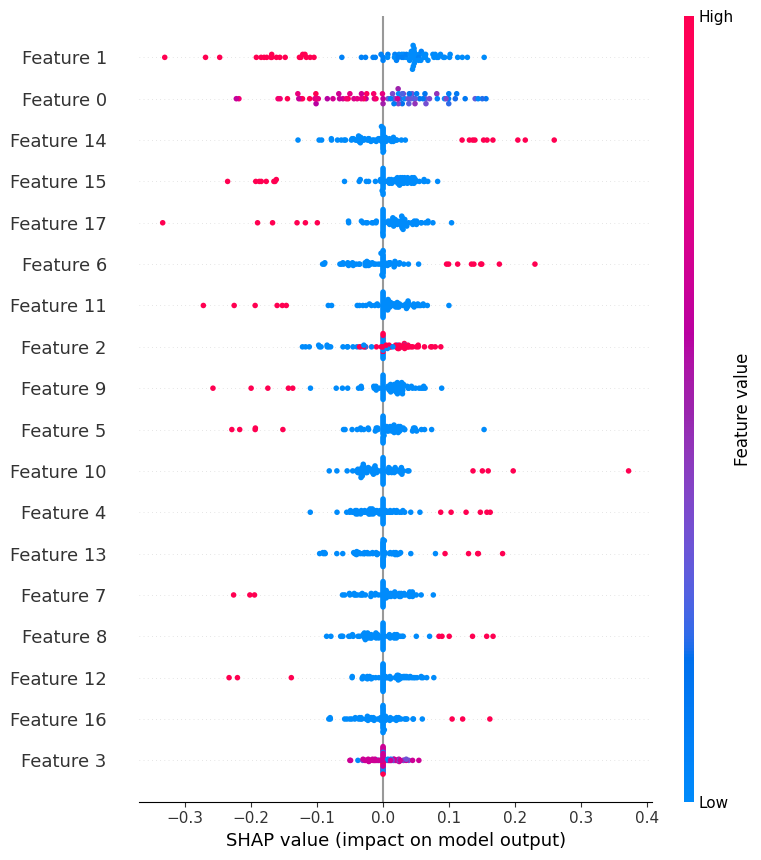

In [51]:
# Get shap values
shap.initjs()
explainer = shap.KernelExplainer(myknn.predict, np.array(X_test))
svc_shap_values = explainer.shap_values(np.array(X_test), nsamples=100)
shap.summary_plot(svc_shap_values, np.array(X_test))

In [52]:
exp = limeExplainer.explain_instance(np.array(X_test)[5], myknn.predict_proba, num_features=34)
exp.show_in_notebook(show_table=True)

Intercept 0.09464801027755526
Prediction_local [0.99280065]
Right: 0.9999999999999998


In [53]:
exp = limeExplainer.explain_instance(np.array(X_test)[6], myknn.predict_proba, num_features=34)
exp.show_in_notebook(show_table=True)

Intercept 0.6760675601768813
Prediction_local [0.12978075]
Right: 0.0


<span style="font-weight:500;font-size:24px">
  PNN
</span><br/>


PNN
[0 0 1 0 1 1 0 1 0 1 1 0 1 1 1 1 0 0 0 0 1 1 0 0 1 0 1 0 0 1 0 1 0 1 0 1 1
 0 1 1 0 1 1 1 1 0 1 1 1 1 1 0 0 1 0 1 0 1 1 1 1 0 0 1 1 1 0 0 0 1 0 1 1 1
 0 0 0 0 1 0]
1.0
[[0.97402833 0.02597167]
 [0.97709404 0.02290596]
 [0.17702435 0.82297565]
 [0.97977395 0.02022605]
 [0.17426468 0.82573532]
 [0.17806418 0.82193582]
 [0.92403257 0.07596743]
 [0.12190323 0.87809677]
 [0.92960241 0.07039759]
 [0.18574858 0.81425142]
 [0.08784717 0.91215283]
 [0.95259364 0.04740636]
 [0.14160695 0.85839305]
 [0.14418824 0.85581176]
 [0.16321281 0.83678719]
 [0.12108374 0.87891626]
 [0.81158981 0.18841019]
 [0.80571651 0.19428349]
 [0.97301154 0.02698846]
 [0.95438569 0.04561431]
 [0.16108802 0.83891198]
 [0.08632164 0.91367836]
 [0.94375364 0.05624636]
 [0.81692081 0.18307919]
 [0.09825273 0.90174727]
 [0.94994842 0.05005158]
 [0.15364292 0.84635708]
 [0.95428692 0.04571308]
 [0.97017346 0.02982654]
 [0.07395751 0.92604249]
 [0.92377188 0.07622812]
 [0.1753486  0.8246514 ]
 [0.93793487 0.06206513]
 [

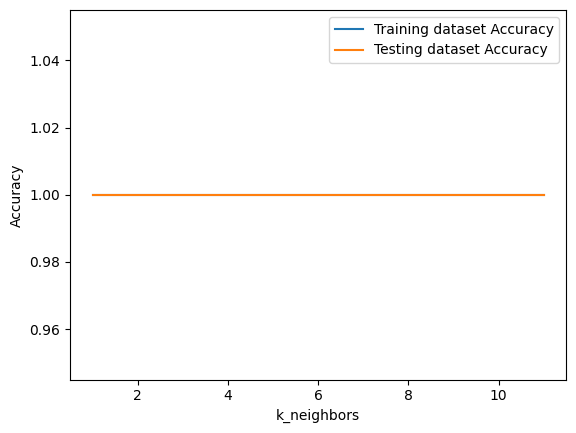

In [54]:
from PNN import PNN

# PNN
pnn = PNN(k_neighbors=k)
pnn.fit(X_train, y_train)
print()
print("PNN")
print(pnn.predict(X_test))
print(pnn.score(X_test, y_test))
print(pnn.predict_proba(np.array(X_test)))
pnn.showScoreInGraph(k_range, X_test, y_test)

100%|██████████| 80/80 [13:47<00:00, 10.35s/it]
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


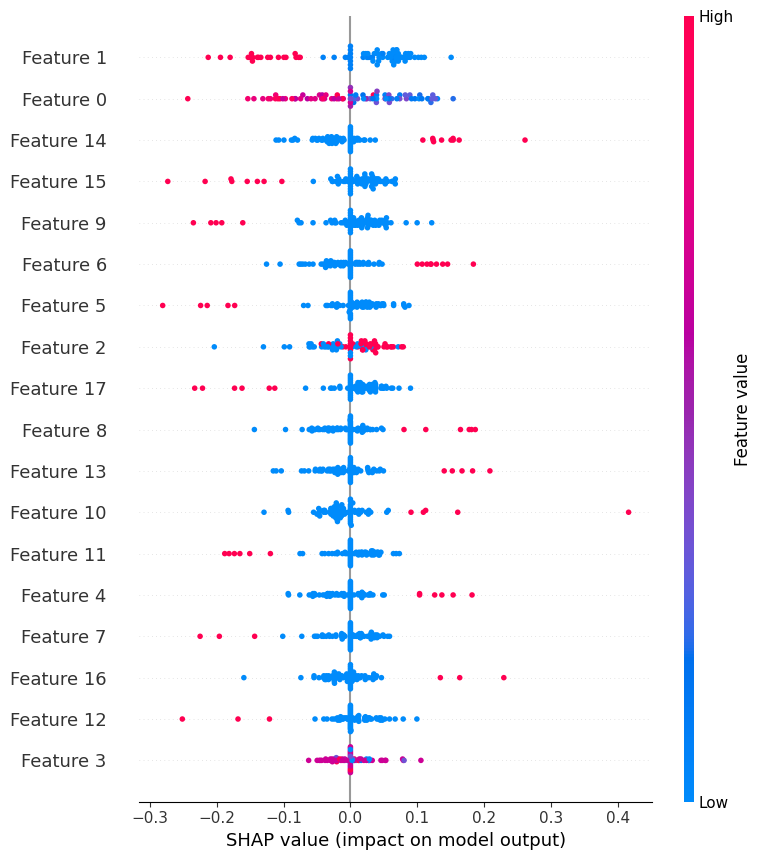

In [55]:
# Get shap values
shap.initjs()
explainer = shap.KernelExplainer(pnn.predict, np.array(X_test))
svc_shap_values = explainer.shap_values(np.array(X_test), nsamples=100)
shap.summary_plot(svc_shap_values, np.array(X_test))

In [56]:
exp = limeExplainer.explain_instance(np.array(X_test)[5], pnn.predict_proba, num_features=34)
exp.show_in_notebook(show_table=True)

Intercept 0.3791692568482286
Prediction_local [0.64835474]
Right: 0.8219358204368197


<span style="font-weight:500;font-size:24px">
  LMPNN
</span><br/>


LMPNN
[0 0 1 0 1 1 0 1 0 1 1 0 1 1 1 1 0 0 0 0 1 1 0 0 1 0 1 0 0 1 0 1 0 1 0 1 1
 0 1 1 0 1 1 1 1 0 1 1 1 1 1 0 0 1 0 1 0 1 1 1 1 0 0 1 1 1 0 0 0 1 0 1 1 1
 0 0 0 0 1 0]
1.0
[[0.99554942 0.00445058]
 [0.99679901 0.00320099]
 [0.01933198 0.98066802]
 [0.99531315 0.00468685]
 [0.05727014 0.94272986]
 [0.03581729 0.96418271]
 [0.98083718 0.01916282]
 [0.01789556 0.98210444]
 [0.98743259 0.01256741]
 [0.09278787 0.90721213]
 [0.03028529 0.96971471]
 [0.98447076 0.01552924]
 [0.0348765  0.9651235 ]
 [0.02243937 0.97756063]
 [0.0725796  0.9274204 ]
 [0.05099068 0.94900932]
 [0.98359429 0.01640571]
 [0.92179685 0.07820315]
 [0.99457163 0.00542837]
 [0.99546973 0.00453027]
 [0.03319114 0.96680886]
 [0.03632145 0.96367855]
 [0.99107007 0.00892993]
 [0.9942269  0.0057731 ]
 [0.04807581 0.95192419]
 [0.99634323 0.00365677]
 [0.01644317 0.98355683]
 [0.99154834 0.00845166]
 [0.99560101 0.00439899]
 [0.04683128 0.95316872]
 [0.980924   0.019076  ]
 [0.05255204 0.94744796]
 [0.98160663 0.01839337]


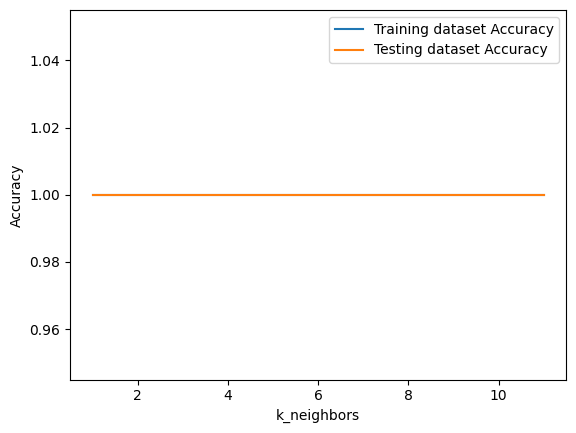

In [57]:
from LMPNN import LMPNN

# LMPNN
lmpnn = LMPNN(k_neighbors=k)
lmpnn.fit(X_train, y_train)
print()
print("LMPNN")
print(lmpnn.predict(X_test))
print(lmpnn.score(X_test, y_test))
print(lmpnn.predict_proba(np.array(X_test)))
lmpnn.showScoreInGraph(k_range, X_test, y_test)

100%|██████████| 80/80 [15:57<00:00, 11.97s/it]
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


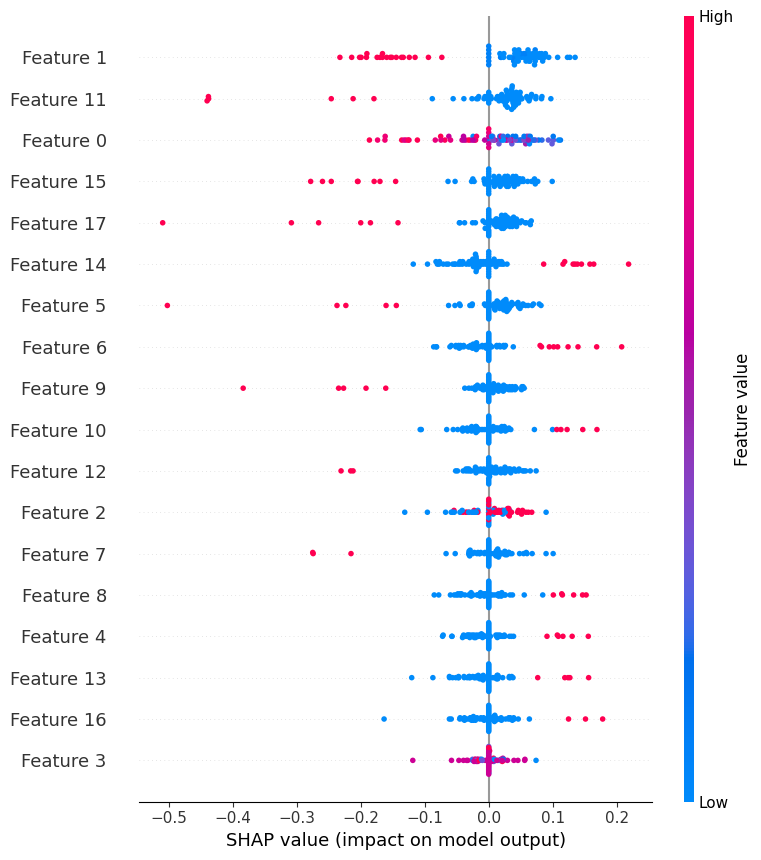

In [58]:
# Get shap values
shap.initjs()
explainer = shap.KernelExplainer(lmpnn.predict, np.array(X_test))
svc_shap_values = explainer.shap_values(np.array(X_test), nsamples=100)
shap.summary_plot(svc_shap_values, np.array(X_test))

In [59]:
exp = limeExplainer.explain_instance(np.array(X_test)[5], lmpnn.predict_proba, num_features=34)
exp.show_in_notebook(show_table=True)

Intercept 0.3311616840171637
Prediction_local [0.70282585]
Right: 0.9641827129931262


<span style="font-weight:500;font-size:24px">
  MVMCNN
</span><br/>

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` exp


MVMCNN
[0 0 1 0 1 1 0 1 0 1 1 0 1 1 1 1 0 0 0 0 1 1 0 0 1 0 1 0 0 1 0 1 0 1 0 1 1
 0 1 1 0 1 1 1 1 0 1 1 1 1 1 0 0 1 0 1 0 1 1 1 1 0 0 1 1 1 0 0 0 1 0 1 1 1
 0 0 0 0 1 0]
1.0
[[0.99561972 0.00438028]
 [0.9968362  0.0031638 ]
 [0.01831787 0.98168213]
 [0.99535756 0.00464244]
 [0.05443739 0.94556261]
 [0.03398343 0.96601657]
 [0.9823233  0.0176767 ]
 [0.01789497 0.98210503]
 [0.98832815 0.01167185]
 [0.09278649 0.90721351]
 [0.03028446 0.96971554]
 [0.98480948 0.01519052]
 [0.03304779 0.96695221]
 [0.02243871 0.97756129]
 [0.07257785 0.92742215]
 [0.04843349 0.95156651]
 [0.98482529 0.01517471]
 [0.92246963 0.07753037]
 [0.99462291 0.00537709]
 [0.99564063 0.00435937]
 [0.03143215 0.96856785]
 [0.03632016 0.96367984]
 [0.99120977 0.00879023]
 [0.99430905 0.00569095]
 [0.04562483 0.95437517]
 [0.99660451 0.00339549]
 [0.01558246 0.98441754]
 [0.991646   0.008354  ]
 [0.99564326 0.00435674]
 [0.04682984 0.95317016]
 [0.98225355 0.01774645]
 [0.04984239 0.95015761]
 [0.98177684 0.01822316]

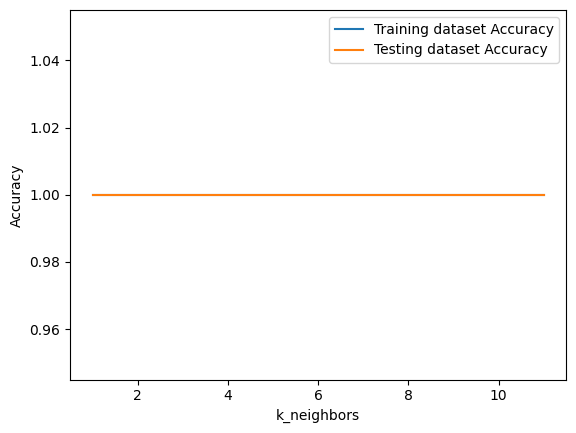

In [60]:
from MVMCNN import MVMCNN

# MVMCNN
mvmcnn = MVMCNN(k_neighbors=k)
mvmcnn.fit(X_train, y_train)
print()
print("MVMCNN")
print(mvmcnn.predict(X_test))
print(mvmcnn.score(X_test, y_test))
print(mvmcnn.predict_proba(np.array(X_test)))
mvmcnn.showScoreInGraph(k_range, X_test, y_test)

100%|██████████| 80/80 [25:05<00:00, 18.82s/it]
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


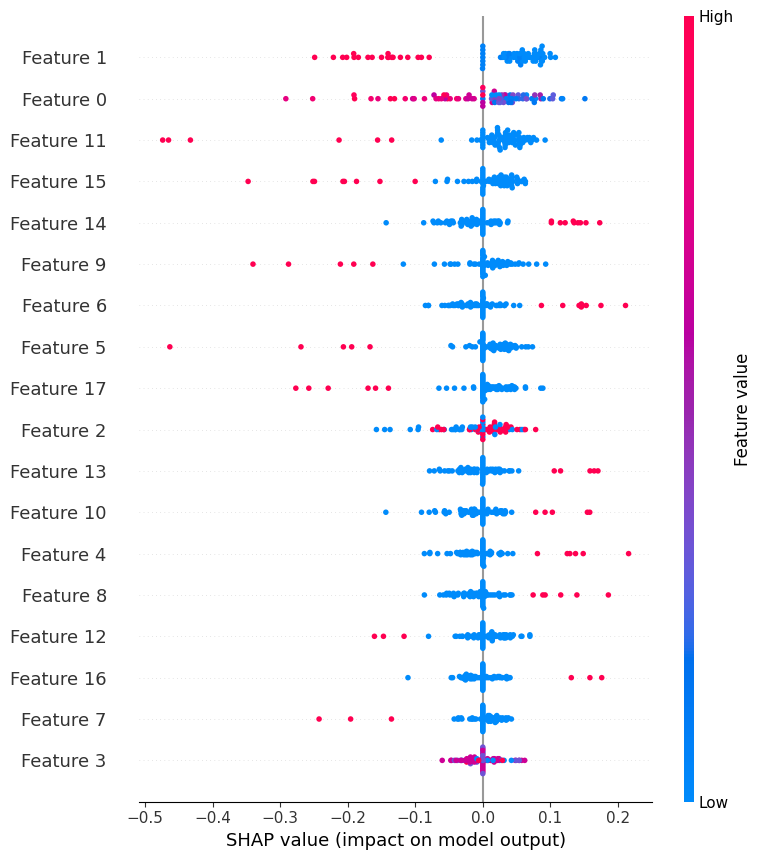

In [61]:
# Get shap values
shap.initjs()
explainer = shap.KernelExplainer(mvmcnn.predict, np.array(X_test))
svc_shap_values = explainer.shap_values(np.array(X_test), nsamples=100)
shap.summary_plot(svc_shap_values, np.array(X_test))

In [62]:
exp = limeExplainer.explain_instance(np.array(X_test)[5], mvmcnn.predict_proba, num_features=34)
exp.show_in_notebook(show_table=True)

Intercept 0.34535724897343717
Prediction_local [0.68131232]
Right: 0.9660165717371126
